# 2024C1 SMI waxs trexs plotting notebook for SMI

In [2]:
!pip install -e /nsls2/users/alevin/repos/PyHyperScattering  # to use pip to install via directory

Obtaining file:///nsls2/users/alevin/repos/PyHyperScattering
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for PyHyperScattering (pyproject.toml) ... done
  Created wheel for PyHyperScattering: filename=PyHyperScattering-0.2.1+37.gac1f562-0.editable-py3-none-any.whl size=5354 sha256=9f7c268e5f68db82efdc3acc16ec9911158ff066555bf1e5ee4d192656b424f8
  Stored in directory: /tmp/pip-ephem-wheel-cache-u0125lrd/wheels/7d/89/c7/db1d0cb1cf714f3a03a438abee7b78ce09921efd15259b1f5f
Successfully built PyHyperScattering
  Attempting uninstall: PyHyperScattering
    Found existing installation: PyHyperScattering 0.2.1+37.gac1f562
    Uninstalling PyHyperScattering-0.2.1+37.gac1f562:
      Successfully uninstalled PyHyperScattering-0.2.1+37.gac1f562


In [1]:
import PyHyperScattering as phs
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from tqdm.auto import tqdm 
import subprocess
import io
print(phs.__version__)

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/load.py:1: UserWarning: Could not import astropy.io.fits, needed for ALS 11.0.1.2 RSoXS loading.  Is this dependency installed?
  from PyHyperScattering.ALS11012RSoXSLoader import ALS11012RSoXSLoader


Imports failed.  Are you running on a machine with proper libraries for databroker, tiled, etc.?


/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


0.2.1+37.gac1f562


In [2]:
# import zarr

In [2]:
# Define paths
propPath = pathlib.Path('/nsls2/data/smi/proposals/2024-1/pass-314903')
outPath = propPath.joinpath('AL_processed_data')
sampleZarrsPath = outPath.joinpath('night2_standard_sample_zarrs')

rawPaths = propPath.joinpath('raw_04')
waxsPath = rawPaths.joinpath('900KW')

In [3]:
unique_sample_names = sorted(set(['_'.join(f.name.split('_')[1:3]) for f in sampleZarrsPath.glob('*')]))
unique_sample_names

['BareSiN_01',
 'BareSiN_03',
 'PM6-Y6BO_CB',
 'PM6-Y6BO_CF',
 'PM6-Y6_CB',
 'PM6-Y6_CF',
 'PM6_1CN-CB',
 'PM6_1CN-CF',
 'PM6_5CN-CB',
 'PM6_5CN-CF',
 'PM6_CB',
 'PM6_CF',
 'PM6_p5CN-CB',
 'PM6_p5CN-CF']

In [104]:
recip_DS_rows = []
caked_DS_rows = []
for sample_name in tqdm(unique_sample_names):
    sample_zarrs = sorted(sampleZarrsPath.glob(f'*{sample_name}*'))
    # display(sorted([f.name for f in sample_zarrs]))
    
    samp_recip_DS_rows = []
    samp_caked_DS_rows = []
    for sample_zarr in sample_zarrs:
        if 'recip_' in sample_zarr.name:
            recip_DS = xr.open_zarr(sample_zarr)
            samp_recip_DS_rows.append(recip_DS)
        elif 'caked_' in sample_zarr.name:
            caked_DS = xr.open_zarr(sample_zarr)
            samp_caked_DS_rows.append(caked_DS)
            
    recip_DS = xr.concat(samp_recip_DS_rows, 'theta')
    recip_DS_rows.append(recip_DS)
    
    caked_DS = xr.concat(samp_caked_DS_rows, 'theta')
    caked_DS_rows.append(caked_DS)
    
recip_DS = xr.concat(recip_DS_rows, 'sample_name')
caked_DS = xr.concat(caked_DS_rows, 'sample_name')

  0%|          | 0/14 [00:00<?, ?it/s]

In [105]:
recip_DS = recip_DS.chunk({'sample_name':1, 'theta':1, 'pix_y': 941, 'pix_x': 867, 'energy':63,})
caked_DS = caked_DS.chunk({'sample_name':1, 'theta':1, 'index_y':500,'index_x':500,'energy':63})

In [9]:
# recip_DS.to_zarr(outPath.joinpath('zarrs', f'recip_waxs_trexs_night2_standard.zarrs'), mode='w')

In [6]:
# energy = 2470

# for sample_name in unique_sample_names:
#     for theta in [90, 55, 35]:
#         sliced_DA = recip_DS.sel(sample_name=sample_name, theta=theta).sel(energy=2470, method='nearest')['flatfield_corr']

#         cmin = sliced_DA.compute().quantile(0.15)
#         cmax = sliced_DA.compute().quantile(0.995)
#         ax = sliced_DA.plot.imshow(norm=plt.Normalize(cmin, cmax), cmap=plt.cm.turbo, x='q_x', y='q_y')
#         ax.axes.set(title=f'{sample_name}: Energy = {energy}, Theta = {theta}')
#         plt.show()
#         plt.close('all')

## Detector movies

In [ ]:
cmap = plt.cm.turbo.copy()
cmap.set_bad(cmap.get_under())

### recip

In [ ]:
# Select Dataset
DS = recip_DS


# Select Plotting Parameters
energy = 2470
pix_size = 500
# pix_x_slice = slice(bcx-(pix_size/2), bcx+(pix_size/2))
# pix_y_slice = slice(bcy-(pix_size/2), bcy+(pix_size/2))

# Select DataArray
# sample_name = 'PM6-Y6_3000_dSiN'
for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        DA = DS.sel(sample_name=sample_name, theta=theta)['flatfield_corr']


        # Plot
        sliced_DA = DA.sel(energy=energy,method='nearest')
        cmin = float(sliced_DA.compute().quantile(0.15))
        cmax = float(sliced_DA.compute().quantile(0.995))

        ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), x='q_x', y='q_y', cmap=cmap, norm=plt.Normalize(cmin,cmax))
        ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
        ax.figure.set_tight_layout(True)
        ax.axes.set(aspect='equal', title=f'{sample_name}, $\\theta$ = {theta}°', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
        ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=12)
        # ax.figure.savefig(outPath.joinpath('waxs_detector_movies_v1', f'{sample_name}_{theta}degth.png'), dpi=120)
        plt.show()
        plt.close('all')

In [ ]:
# Select Dataset
DS = recip_DS

# Select DataArray
for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        DA = DS.sel(sample_name=sample_name, theta=theta)['flatfield_corr']
        cmin = float(DA.compute().quantile(0.15))
        cmax = float(DA.compute().quantile(0.995))

        output_path = outPath.joinpath('waxs_detector_movies_v1', f'{sample_name}_{theta}degth.mp4')

        # FFmpeg command. This is set up to accept data from the pipe and use it as input, with PNG format.
        # It will then output an H.264 encoded MP4 video.
        cmd = [
            'ffmpeg',
            '-y',  # Overwrite output file if it exists
            '-f', 'image2pipe',
            '-vcodec', 'png',
            '-r', '15',  # Frame rate
            '-i', '-',  # The input comes from a pipe
            '-vcodec', 'libx264',
            '-pix_fmt', 'yuv420p',
            '-crf', '17',  # Set the quality (lower is better, 17 is often considered visually lossless)
            str(output_path)
        ]

        # Start the subprocess
        proc = subprocess.Popen(cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

        # Loop through the energy dimension and send frames to FFmpeg
        for energy in tqdm(DA.energy.values, desc=f'Making the {sample_name} movie'):
            # Make & customize plot
            sliced_DA = DA.sel(energy=energy, method='nearest')
            
            ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), x='q_x', y='q_y', cmap=cmap, norm=plt.Normalize(cmin,cmax))
            ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
            ax.figure.set_tight_layout(True)   
            ax.axes.set(aspect='equal', title=f'{sample_name}, $\\theta$ = {theta}°', xlabel='q$_x$ [$Å^{-1}$]', ylabel='q$_y$ [$Å^{-1}$]')
            ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=12)

            # Save figure to a PNG buffer
            # ax.figure.savefig(plotsPath.joinpath('detector_movies/frames', f'energy-{round(energy)}_frame-{i:03d}.png'), dpi=120)

            buf = io.BytesIO()
            ax.figure.savefig(buf, format='png')
            buf.seek(0)

            # Write the PNG buffer data to the process
            proc.stdin.write(buf.getvalue())
            plt.close('all')

        # Finish the subprocess
        out, err = proc.communicate()
        if proc.returncode != 0:
            print(f"Error: {err}")


### caked

In [ ]:
# Select Dataset
DS = caked_DS


# Select Plotting Parameters
energy = 2470
chi_slice = slice(-150,50)
# chi_slice = slice(None,None)

qr_slice = slice(None,0.7)
# qr_slice = slice(None,None)

# Select DataArray
# sample_name = 'PM6-Y6_3000_dSiN'
for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        DA = DS.sel(sample_name=sample_name, theta=theta)['flatfield_corr']


        # Plot
        sliced_DA = DA.sel(energy=energy,method='nearest').swap_dims({'index_y':'chi','index_x':'q_r'}).sel(
            chi=chi_slice, q_r=qr_slice)
        cmin = float(sliced_DA.compute().quantile(0.1))
        cmax = float(sliced_DA.compute().quantile(0.99))

        ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), x='q_r', y='chi', cmap=cmap, norm=plt.Normalize(cmin,cmax))
        ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
        ax.figure.set_tight_layout(True)
        ax.axes.set(title=f'{sample_name}, $\\theta$ = {theta}°', xlabel='q$_r$ [$Å^{-1}$]', ylabel='$\\chi$ [°]')
        ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=12)
        # ax.figure.savefig(outPath.joinpath('waxs_detector_movies_v1', f'{sample_name}_{theta}degth.png'), dpi=120)
        plt.show()
        plt.close('all')

In [ ]:
# Select Dataset
DS = caked_DS.copy()

# plotting parameters
chi_slice = slice(-150,50)
# chi_slice = slice(None,None)

qr_slice = slice(None,0.7)
# qr_slice = slice(None,None)

# Select DataArray
for sample_name in tqdm(unique_sample_names):
# for sample_name in tqdm(['PM6_1CN-CB']):
    for theta in [90, 55, 35]:
        DA = DS.sel(sample_name=sample_name, theta=theta)['flatfield_corr']
        cmin = float(DA.compute().quantile(0.15))
        cmax = float(DA.compute().quantile(0.995))

        output_path = outPath.joinpath('trexs_plots/caked_waxs_detector_movies_v1', f'{sample_name}_{theta}degth.mp4')

        # FFmpeg command. This is set up to accept data from the pipe and use it as input, with PNG format.
        # It will then output an H.264 encoded MP4 video.
        cmd = [
            'ffmpeg',
            '-y',  # Overwrite output file if it exists
            '-f', 'image2pipe',
            '-vcodec', 'png',
            '-r', '15',  # Frame rate
            '-i', '-',  # The input comes from a pipe
            '-vcodec', 'libx264',
            '-pix_fmt', 'yuv420p',
            '-crf', '17',  # Set the quality (lower is better, 17 is often considered visually lossless)
            str(output_path)
        ]

        # Start the subprocess
        proc = subprocess.Popen(cmd, stdin=subprocess.PIPE, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

        # Loop through the energy dimension and send frames to FFmpeg
        for i, energy in enumerate(tqdm(DA.energy.values, desc=f'Making the {sample_name} {theta}° movie')):
            # Make & customize plot
            sliced_DA = DA.sel(energy=energy,method='nearest').swap_dims(
                {'index_y':'chi','index_x':'q_r'}).sel(chi=chi_slice, q_r=qr_slice)
            
            ax = sliced_DA.plot.imshow(figsize=(5.5,4.5), cmap=cmap, norm=plt.Normalize(cmin,cmax))
            ax.figure.suptitle(f'Photon Energy = {np.round(energy, 1)} eV', fontsize=14, y=0.96)
            ax.figure.set_tight_layout(True)   
            ax.axes.set(title=f'{sample_name}, $\\theta$ = {theta}°', xlabel='q$_r$ [$Å^{-1}$]', ylabel='$\\chi$ [°]')
            ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=12)

            # Save figure if first frame:
            if i==0:
                ax.figure.savefig(outPath.joinpath('trexs_plots/caked_waxs_detector_movies_v1', f'{sample_name}_{theta}degth.png'), dpi=120)

            buf = io.BytesIO()
            ax.figure.savefig(buf, format='png')
            buf.seek(0)

            # Write the PNG buffer data to the process
            proc.stdin.write(buf.getvalue())
            plt.close('all')

        # Finish the subprocess
        out, err = proc.communicate()
        if proc.returncode != 0:
            print(f"Error: {err}")


## Anisotropy Ratio Plots

### 1. 2D AR Maps

In [106]:
caked_DS = caked_DS.swap_dims({'index_y':'chi'})

q_r_coords = caked_DS.q_r.mean('energy')
caked_DS = caked_DS.assign_coords({'q_red':('index_x', q_r_coords.data)}).swap_dims({'index_x':'q_red'})
caked_DS

<xarray.Dataset>
Dimensions:         (chi: 500, energy: 63, sample_name: 14, theta: 3, q_red: 500)
Coordinates:
  * chi             (chi) float64 -179.6 -178.9 -178.2 ... 178.2 178.9 179.6
  * energy          (energy) float64 2.445e+03 2.45e+03 ... 2.54e+03 2.55e+03
    index_x         (q_red) int64 0 1 2 3 4 5 6 ... 493 494 495 496 497 498 499
    index_y         (chi) int64 0 1 2 3 4 5 6 7 ... 493 494 495 496 497 498 499
    q_r             (energy, q_red) float64 dask.array<chunksize=(63, 500), meta=np.ndarray>
  * sample_name     (sample_name) object 'BareSiN_01' ... 'PM6_p5CN-CF'
  * theta           (theta) float64 35.0 55.0 90.0
  * q_red           (q_red) float64 0.01104 0.01311 0.01518 ... 1.043 1.045
Data variables:
    flatfield_corr  (energy, sample_name, theta, chi, q_red) float64 dask.array<chunksize=(63, 1, 1, 500, 500), meta=np.ndarray>

In [107]:
def make_para_perp_DAs(DS, sample_name, theta=90, chi_width=90):
    # select dataarray to plot
    DA = DS.sel(sample_name=sample_name)['flatfield_corr']
    sel_DA = DA.sel(theta=theta)

    # calculate ISI dataarrays
    para_DA = sel_DA.rsoxs.slice_chi(0, chi_width=(chi_width/2))
    perp_DA = sel_DA.rsoxs.slice_chi(-90, chi_width=(chi_width/2))
        
    return para_DA, perp_DA

In [136]:
para_DA.interpolate_na(dim='chi')

<xarray.DataArray 'flatfield_corr' (energy: 63, chi: 125, q_red: 500)>
dask.array<transpose, shape=(63, 125, 500), dtype=float64, chunksize=(63, 125, 500), chunktype=numpy.ndarray>
Coordinates:
  * chi          (chi) float64 -45.0 -44.28 -43.56 -42.84 ... 42.84 43.56 44.28
  * energy       (energy) float64 2.445e+03 2.45e+03 ... 2.54e+03 2.55e+03
    index_x      (q_red) int64 0 1 2 3 4 5 6 7 ... 493 494 495 496 497 498 499
    index_y      (chi) int64 187 188 189 190 191 192 ... 306 307 308 309 310 311
    q_r          (energy, q_red) float64 dask.array<chunksize=(63, 500), meta=np.ndarray>
    sample_name  <U11 'PM6_p5CN-CF'
    theta        float64 35.0
  * q_red        (q_red) float64 0.01104 0.01311 0.01518 ... 1.041 1.043 1.045
Attributes:
    bpm:                   bpm5.197
    detector:              WAXS.tif
    energy:                2445.00eV
    id:                    id519247
    misc:                  000000
    project:               TC
    rotation_from_normal:  prs55deg
    sample_number:         01
    sample_type:           Trmsn
    set_sdd:               sdd1.8m
    waxs_det_position:     wa0

  0%|          | 0/14 [00:00<?, ?it/s]

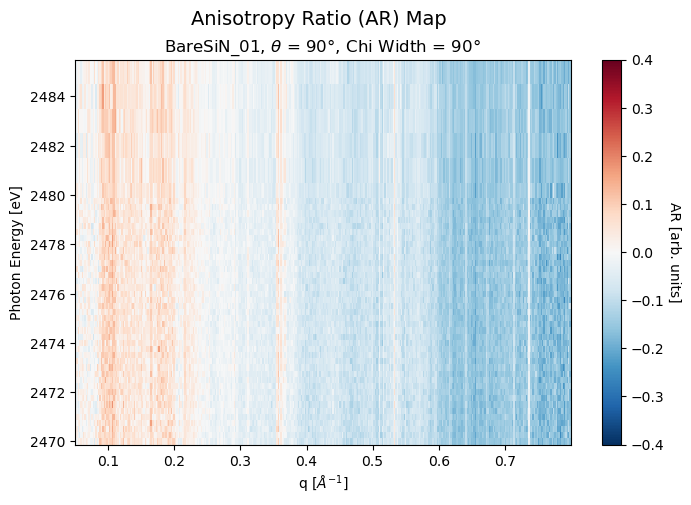

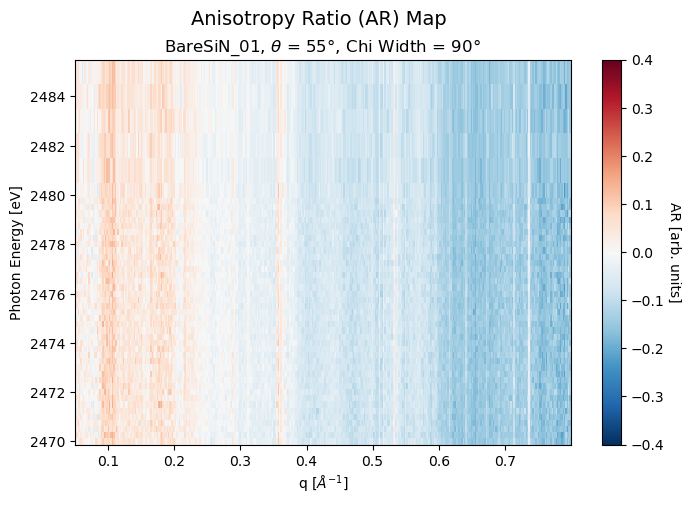

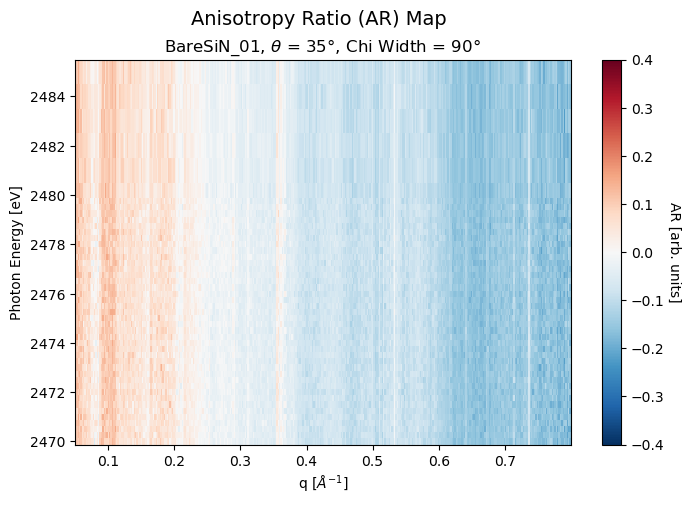

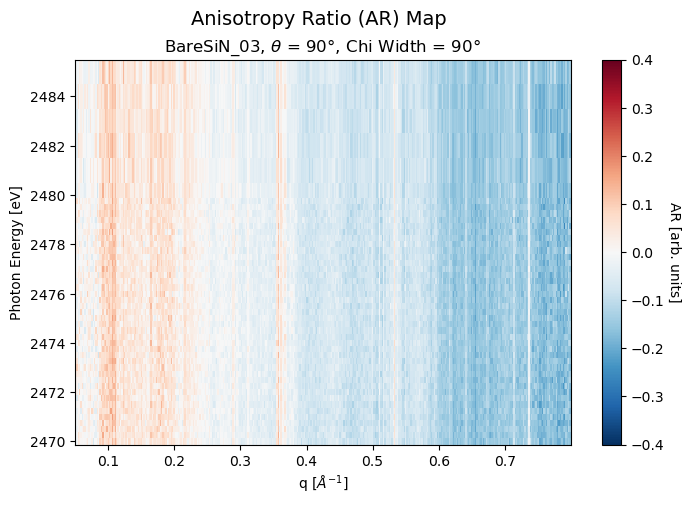

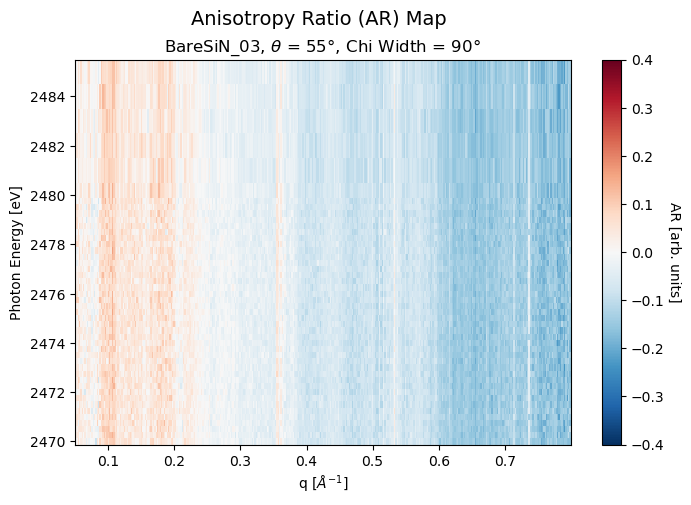

...

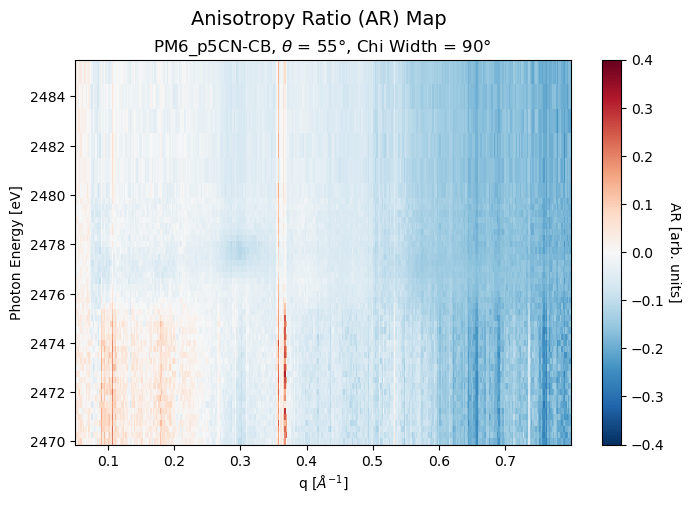

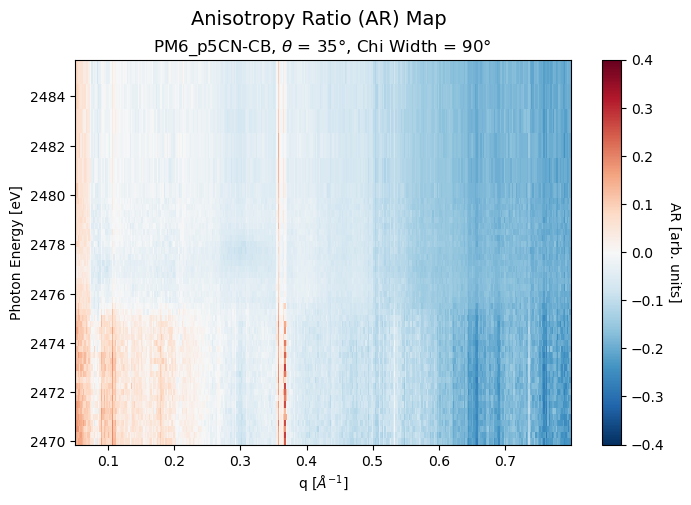

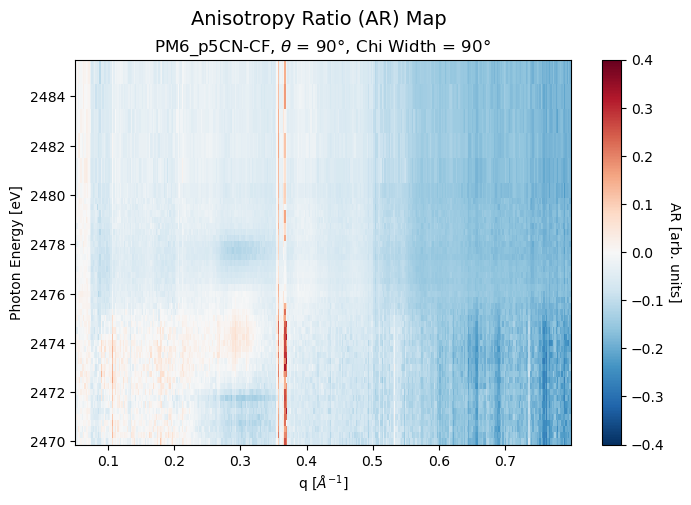

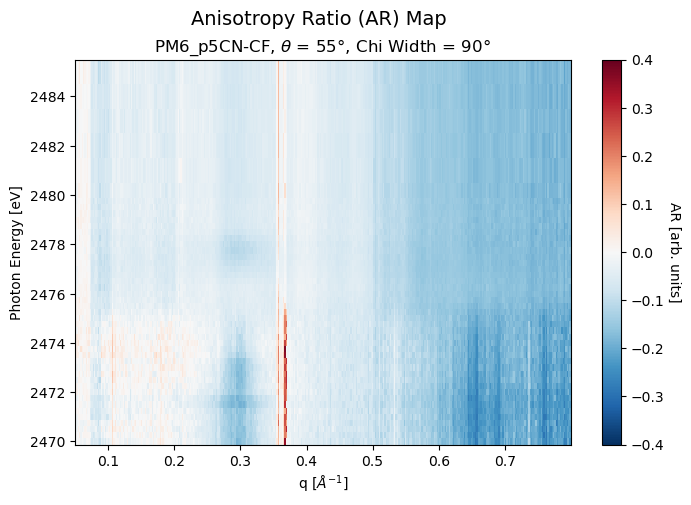

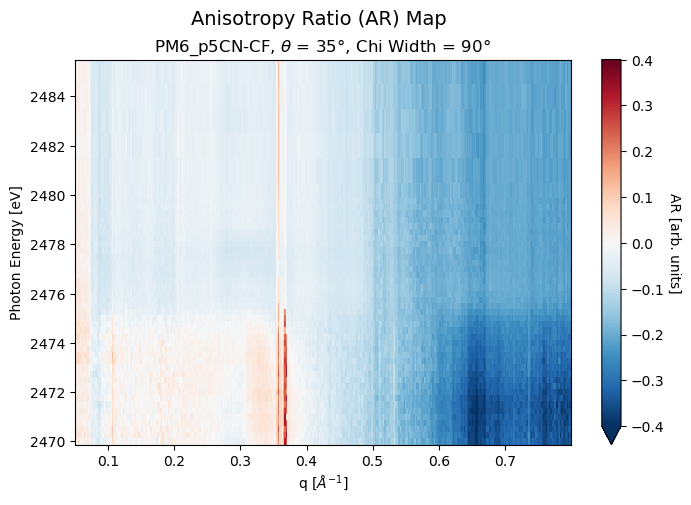

In [241]:
DS = caked_DS.copy()

# make selection
q_slice = slice(0.05, 0.8)
chi_width = 90
energy_slice = slice(2470, 2485)

# para_sin35, perp_sin35 = make_para_perp_DAs(DS, 'BareSiN_01', 35, chi_width) 
# para_sin55, perp_sin55 = make_para_perp_DAs(DS, 'BareSiN_01', 55, chi_width) 
# para_sin90, perp_sin90 = make_para_perp_DAs(DS, 'BareSiN_01', 90, chi_width) 

for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, theta, chi_width) 
        
        para_DA = para_DA.where(para_DA>0.4).where(para_DA<(para_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # para_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('para')
        # plt.show()
        
        perp_DA = perp_DA.where(perp_DA>0.4).where(perp_DA<(perp_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # perp_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('perp')
        # plt.show()
        # plt.close('all')
            
        # Select AR data
        ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

        # Plot
        vlim = 0.4
        ax = ar_DA.sel(energy=energy_slice, q_red=q_slice).plot.pcolormesh(
            cmap=plt.cm.RdBu_r, figsize=(8,5), norm=plt.Normalize(-vlim, vlim), xscale='linear')
        # ax = ar_DA.sel(energy=energy_slice, q_red=q_slice).plot.pcolormesh(figsize=(8,5))

        ax.figure.suptitle('Anisotropy Ratio (AR) Map', fontsize=14, x=0.43)
        ax.axes.set(title=f'{sample_name}, $\\theta$ = {theta}°, Chi Width = {chi_width}°', ylabel='Photon Energy [eV]', xlabel='q [$Å^{-1}$]')
        ax.colorbar.set_label('AR [arb. units]', rotation=270, labelpad=12)


        # ax.figure.savefig(outPath.joinpath('trexs_plots/ar_maps_v1', 
        #     f'{sample_name}_theta-{theta}deg_chiWidth-{chi_width}deg_q-{q_slice.start}-{q_slice.stop}_energy{energy_slice.start}-{energy_slice.stop}.png'), 
        #                   dpi=120)

        plt.show()
        plt.close('all')

In [239]:
outPath.joinpath('trexs_plots/ar_maps_v1')

PosixPath('/nsls2/data/smi/proposals/2024-1/pass-314903/AL_processed_data')

### 2. 1D meaned AR linecuts

In [261]:
# make selection
# sample_name = 'Y6_CB_2500'
DS = caked_DS.copy()

# make selection
q_slice = slice(0.05, 0.8)
chi_width = 90
# energy_slice = slice(2470, 2485)

for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, theta, chi_width) 
        
        para_DA = para_DA.where(para_DA>0.4).where(para_DA<(para_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # para_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('para')
        # plt.show()
        
        perp_DA = perp_DA.where(perp_DA>0.4).where(perp_DA<(perp_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # perp_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('perp')
        # plt.show()
        # plt.close('all')
            
        # Select AR data
        ar_DA = (para_DA.mean('chi') - perp_DA.mean('chi')) / (para_DA.mean('chi') + perp_DA.mean('chi'))

        # Plot   
        energies = para_DA.energy.sel(energy=[2445, 2470.2, 2472, 2474, 2476, 2477, 2478, 2484, 2550], method='nearest').data
        cmap = plt.cm.turbo.copy()
        colors = cmap(np.linspace(0, 1, len(energies)))        

        # # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
        # sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=energies[0], vmax=energies[-1]))
        # cax = ax.inset_axes([1.03, 0, 0.03, 1])
        # cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
        # cbar.set_label(label=f'Time [seconds]', labelpad=14)
        # cbar.set_ticks(np.round(np.linspace(energies[0], energies[-1], len(energies)), 2))

        fig, ax = plt.subplots(tight_layout=True, figsize=(6,4), dpi=120)

        qmin = 8e-3 
        qmax = 8e-2

        for j, energy in enumerate(energies):
            (ar_DA.sel(energy=energy, q_red=q_slice).plot.line(ax=ax, color=colors[j], label=energy, xscale='linear'))

        fig.suptitle(f'Anisotropy Ratio Linecuts: {sample_name}', x=0.46)

        ax.set(title=f'Chi width = {chi_width}°, $\\theta$ = {theta}°', ylim=(-0.5, 0.5), ylabel='AR [arb. units]', xlabel='Q [$Å^{-1}$]')
        ax.legend(title='Energy [eV]', loc=(1.03,0.02))


        fig.savefig(outPath.joinpath('trexs_plots/ar_cuts_v1', 
            f'{sample_name}_theta-{theta}deg_chiWidth-{chi_width}deg_q-{q_slice.start}-{q_slice.stop}.png'), dpi=120)

        # plt.show()
        plt.close('all')

  0%|          | 0/14 [00:00<?, ?it/s]

In [ ]:
ar_DA.hvplot.line(groupby="energy")

## Meaned 1D intensity lineplots, selected energies

In [250]:
# manual_scale_factors_v1 = {
#     'PM6_CB_3000': 6.5,
#     ...
#     'Y6_CF_2500': 8.5,
# }

# len(manual_scale_factors_v1)

In [262]:
# make selection
DS = caked_DS.copy()

# make selection
q_slice = slice(0.05, 0.8)
chi_width = 90
# energy_slice = slice(2470, 2485)

for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, theta, chi_width) 
        
        para_DA = para_DA.where(para_DA>0.4).where(para_DA<(para_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # para_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('para')
        # plt.show()
        
        perp_DA = perp_DA.where(perp_DA>0.4).where(perp_DA<(perp_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # perp_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('perp')
        # plt.show()
        # plt.close('all')

        # Plot
        energies = para_DA.energy.sel(energy=[2445, 2470.2, 2472, 2474, 2476, 2477, 2478, 2484, 2550], method='nearest').data

        cmap = plt.cm.turbo.copy()
        colors = cmap(np.linspace(0, 1, len(energies)))

        fig, axs = plt.subplots(ncols=2,figsize=(8,4), tight_layout=True)

        qmin = qlims[0]
        qmax = qlims[1]

        for j, energy in enumerate(energies):
            (para_DA.sel(q_red=q_slice, energy=energy).mean('chi')
             .plot.line(ax=axs[0], color=colors[j], yscale='linear', xscale='linear', label=energy))
            (perp_DA.sel(q_red=q_slice, energy=energy).mean('chi')
             .plot.line(ax=axs[1], color=colors[j], yscale='linear', xscale='linear', label=energy))

        fig.suptitle(f'IvsQ , $\\theta$ = {theta}°, $\chi$ width = 90°: {sample_name}', x=0.47)

        axs[0].set(title=f'Parallel to E$_p$', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
        axs[1].set(title=f'Perpendicular to E$_p$', ylabel='Intensity [arb. units]', xlabel='Q [$Å^{-1}$]')
        axs[1].legend(title='Energy [eV]', loc=(1.05,0.1))

        fig.savefig(outPath.joinpath('trexs_plots/I_cuts_v1', 
            f'{sample_name}_theta-{theta}deg_chiWidth-{chi_width}deg_q-{q_slice.start}-{q_slice.stop}.png'), dpi=120)
        
        # plt.show()
        plt.close('all')

  0%|          | 0/14 [00:00<?, ?it/s]

## ISI Plots

In [ ]:
# DA = rsoxs_datasets['polar_carbon']['corr_intensity']
# DA.sel(sample_name='Y6_CB_3000', polarization=0, q=slice(0.001, 0.03)).sel(energy=398.8, method='nearest').plot(norm=LogNorm(1e9, 1e11), cmap=plt.cm.turbo)
# plt.show()

In [ ]:
outPath

In [272]:
# make selection
DS = caked_DS.copy()

# make selection
q_slice = slice(0.05, 0.8)
chi_width = 90
energy_slice = slice(2470, 2485)

for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, theta, chi_width) 
        
        para_DA = para_DA.where(para_DA>0.4).where(para_DA<(para_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # para_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('para')
        # plt.show()
        
        perp_DA = perp_DA.where(perp_DA>0.4).where(perp_DA<(perp_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # perp_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('perp')
        # plt.show()
        # plt.close('all')
    

        # slice ISI data
        para_ISI = para_DA.sel(q_red=q_slice).mean('chi').integrate('q_red')
        perp_ISI = perp_DA.sel(q_red=q_slice).mean('chi').integrate('q_red')

        # plot
        fig, ax = plt.subplots(figsize=(6,4), dpi=120)

        para_ISI.sel(energy=energy_slice).plot.line(ax=ax, label='$\parallel$', yscale='log')
        perp_ISI.sel(energy=energy_slice).plot.line(ax=ax, label='$\perp$', yscale='log')
        fig.suptitle(f'ISI: {sample_name}', fontsize=14, x=0.55)
        ax.set(title=f'$\\theta$ = {theta}°, chi width = {chi_width}°, Q = ({q_slice.start}, {q_slice.stop}) ' + 'Å$^{-1}$', 
               xlabel='X-ray energy [eV]', ylabel='Intensity [arb. units]')
        ax.legend(loc='upper right', fontsize=14)
        ax.grid(axis='x')
        plt.subplots_adjust(top=0.86, bottom=0.2, left=0.2)
        
        fig.savefig(outPath.joinpath('trexs_plots/ISIs_v1', 
            f'{sample_name}_theta-{theta}deg_chiWidth-{chi_width}deg_q-{q_slice.start}-{q_slice.stop}_energy{energy_slice.start}-{energy_slice.stop}.png'),
            dpi=120)

        # plt.show()
        plt.close('all')

  0%|          | 0/14 [00:00<?, ?it/s]

## 2D Linecut Maps

In [288]:
# make selection
DS = caked_DS.copy()

# make selection
q_slice = slice(0.05, 0.8)
chi_width = 90
energy_slice = slice(2470, 2485)

for sample_name in tqdm(unique_sample_names):
    for theta in [90, 55, 35]:
        para_DA, perp_DA = make_para_perp_DAs(DS, sample_name, theta, chi_width) 
        
        para_DA = para_DA.where(para_DA>0.4).where(para_DA<(para_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # para_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('para')
        # plt.show()
        
        perp_DA = perp_DA.where(perp_DA>0.4).where(perp_DA<(perp_DA.max()*0.03))  #.interpolate_na(dim='chi')
        # perp_DA.sel(energy=2477.2,method='nearest').sel(q_red=slice(0.05, 0.7)).plot.imshow()
        # plt.title('perp')
        # plt.show()
        # plt.close('all')

        # Plot
        fig, axs = plt.subplots(1, 2, figsize=(10,5))
        cmin = float(para_DA.compute().quantile(0.1))
        cmax = float(para_DA.compute().quantile(0.99))

        para_slice = para_DA.mean('chi').sel(q_red=q_slice, energy=energy_slice)  # .plot(ax=axs[0], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)
        perp_slice = perp_DA.mean('chi').sel(q_red=q_slice, energy=energy_slice)  # .plot(ax=axs[1], cmap=cmap, norm=LogNorm(cmin, cmax), add_colorbar=False)

        para_slice.plot(ax=axs[0], cmap=cmap, norm=plt.Normalize(cmin, cmax), add_colorbar=False)
        perp_slice.plot(ax=axs[1], cmap=cmap, norm=plt.Normalize(cmin, cmax), add_colorbar=False)

        # Add colorbar
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(cmin, cmax)) # Create a ScalarMappable object with the colormap and normalization & add the colorbar to the figure
        cax = axs[1].inset_axes([1.03, 0, 0.05, 1])
        cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
        cbar.set_label(label='Intensity [arb. units]', labelpad=12, rotation=270)

        fig.suptitle(f'Intensity maps: {sample_name}, $\\theta$ = {theta}°, $\\chi$ width = {chi_width}°', fontsize=14)
        fig.set(tight_layout=True)

        axs[0].set(xscale='linear', title='Parallel to $E_p$', ylabel='Photon energy [eV]', xlabel='Q [$Å^{-1}$]')
        axs[1].set(xscale='linear', title='Perpendicular to $E_p$ ', ylabel=None, xlabel='Q [$Å^{-1}$]')

        fig.savefig(outPath.joinpath('trexs_plots/I_maps_v1', 
                    f'{sample_name}_theta-{theta}deg_chiWidth-{chi_width}deg_q-{q_slice.start}-{q_slice.stop}_energy{energy_slice.start}-{energy_slice.stop}.png'), 
                    dpi=120)

        # plt.show()
        plt.close('all')

  0%|          | 0/14 [00:00<?, ?it/s]

In [ ]:
# a = para_EvsQ_avg.hvplot.line(groupby="energy", loglog=True)
# a * perp_EvsQ_avg.hvplot.line(groupby="energy")